In [2]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.datasets import fetch_olivetti_faces
from sklearn.neighbors import KNeighborsClassifier

# Image Creation

In [3]:
# loading data
import itertools
from keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split

W = 64

def augment(x, y, num):
  gen = ImageDataGenerator(rotation_range = 3, shear_range = 3, 
                           zoom_range = 0.1, horizontal_flip = False)
  it = gen.flow(x.reshape((-1,W,W,1)), y, batch_size = 1)
  xy = itertools.islice(it, num)
  x,y = zip(*xy)
  return np.array(x).squeeze(), np.array(y).squeeze()

def get_faces_data(n_train, n_test):
  images = fetch_olivetti_faces()['images']
  labels = np.array(range(len(images)))//10
  x_train, x_test, y_train, y_test = train_test_split(images, labels, test_size = 50)
  x_train, y_train = augment(x_train, y_train, n_train)  
  x_test, y_test = augment(x_test, y_test, n_test)

  return x_train, y_train, x_test, y_test

In [4]:
x_train, y_train, x_test, y_test = get_faces_data(n_train = 2_000, n_test = 10_000)

downloading Olivetti faces from https://ndownloader.figshare.com/files/5976027 to /root/scikit_learn_data


In [5]:
x_t = x_train.reshape(2000,64*64)
u, s, vt = np.linalg.svd(x_t)

In [6]:
def trunc(r, dataset, basis):
  return dataset.reshape(len(dataset), 64*64)@basis[:r].T

My first thought on how to create new faces from a dataset was to use the basis vectors and apply a value to each to create a new image. This would let me create an image that is somewhat of a mix of all of the images, but not one in particular.

In [306]:
# contains the values to multiply each basis vector to get back to the original
x_train_trunc_Full = trunc(4096, x_train, vt)

Here I implement the function I mentioned with different values of r. The function creates a vector by choosing randomly from 0-2000 from the train set of the data and then finding the value that that basis would be multiplied by. This is done up to r times.

I've found that an r around 10-100 works best. Too little and the image isn't definitive enough, and too large and the image is too noisy. I wonder if a denoising function would make the full r images look the best, but they also all have some sort of glassses because of the randomness, which is not representative of the individual images in the dataset.

<Figure size 2880x720 with 0 Axes>

<Figure size 2880x720 with 0 Axes>

<Figure size 2880x720 with 0 Axes>

<Figure size 2880x720 with 0 Axes>

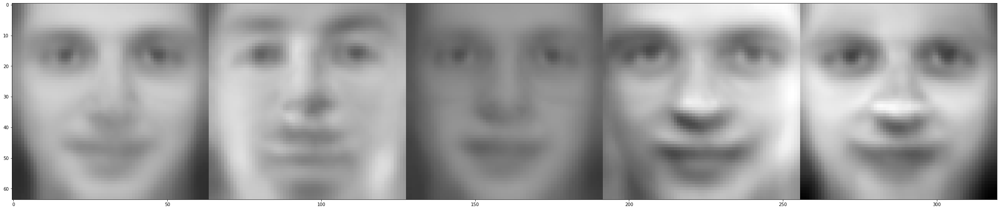

<Figure size 2880x720 with 0 Axes>

<Figure size 2880x720 with 0 Axes>

<Figure size 2880x720 with 0 Axes>

<Figure size 2880x720 with 0 Axes>

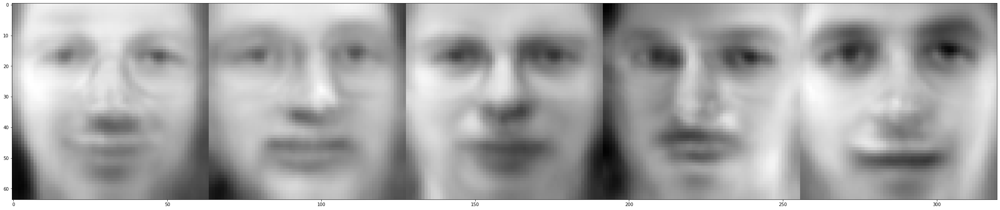

<Figure size 2880x720 with 0 Axes>

<Figure size 2880x720 with 0 Axes>

<Figure size 2880x720 with 0 Axes>

<Figure size 2880x720 with 0 Axes>

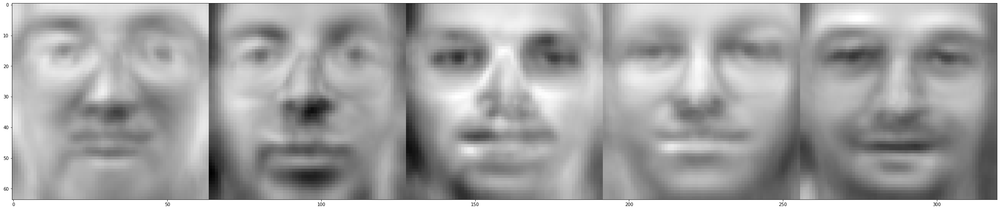

<Figure size 2880x720 with 0 Axes>

<Figure size 2880x720 with 0 Axes>

<Figure size 2880x720 with 0 Axes>

<Figure size 2880x720 with 0 Axes>

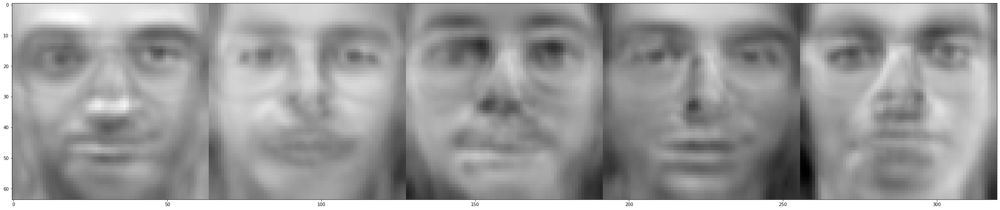

<Figure size 2880x720 with 0 Axes>

<Figure size 2880x720 with 0 Axes>

<Figure size 2880x720 with 0 Axes>

<Figure size 2880x720 with 0 Axes>

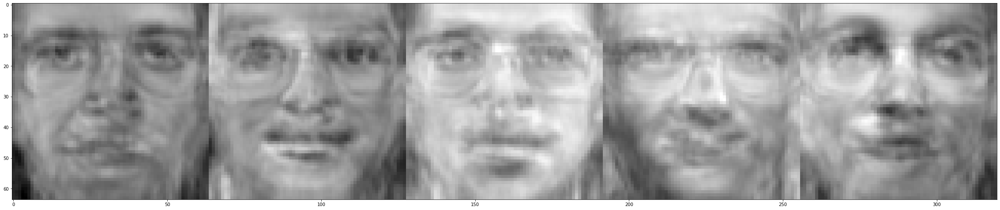

<Figure size 2880x720 with 0 Axes>

<Figure size 2880x720 with 0 Axes>

<Figure size 2880x720 with 0 Axes>

<Figure size 2880x720 with 0 Axes>

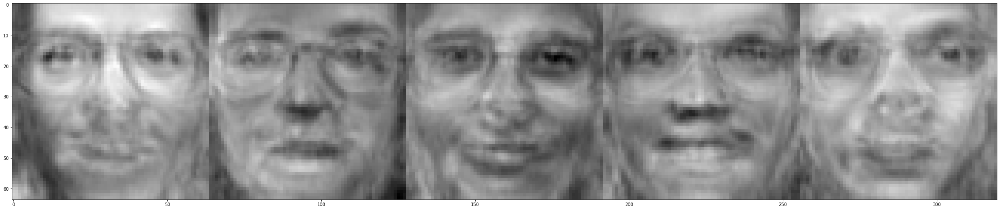

In [308]:
import random
from sklearn.neighbors import KDTree
def print_New(r, num):
  images = x_train[0]
  for j in range(0,num):
    # a builds up the basis in each loop
    a=0
    plt.figure(figsize = (40,10))
    img = np.ones((2000,r))
    
    # creates the new image basis for one image through random choice
    for z in range(0,r):
      piece = np.random.randint(2000)
      img[j][z] = x_train_trunc_Full[piece][z]
    
    #images contains all of the basis values up to r including the original image
    for i in range(0,r):
      # calculate the image by each basis
      a = a + img[j][i]*vt[i].reshape(64,64)
    
    images = np.append(images, a)
  
  images = images.reshape(j+2, 64, 64)[1:j+2]
  plt.imshow(np.hstack(images), cmap = 'gray')
  plt.show()

print_New(10, 5)
print_New(25, 5)
print_New(50, 5)
print_New(100, 5)
print_New(1000, 5)
print_New(4096, 5)

In my next attempt I try a similar approach, but tried to mix it up with less complete randomness. I wanted to smooth out the later images so they weren't as noisy. I used the previous algorithim, but only for r/2 of the time. The other half of the time I would use the values of the image closest to the once made in the first half. I had hoped that this would make the basis' at the end smoother, but this wasn't really the case. Larger values under r made it too close to the image chosen.

I also had another tree set up of the basis vectors to do something similar, but it ran much slower and wasn't much better.

I compare the image to the closest one to make sure that there it isn't too close to any current ones.

In [309]:
kd_image = KDTree(x_train.reshape(2000,64*64))
# kd_tree = KDTree(x_train_trunc_Full)

In [310]:
def print_New_2(r):
  images = x_train[0]
  random.seed(10)
  for j in range(0,5):

    # a builds up the basis in each loop
    a=0
    k=1
    p=-1
    
    # img is the matrix to hold the new basis vector pieces
    img = np.ones((2000,4096))
    plt.figure(figsize = (10,10))
   
    x_train_trunc_New = trunc(r, x_train, vt)
    
    for i in range(0,r):
      
      # p keeps the current closest image when i is over half of r and uses it from then on
      piece = np.random.randint(2000)
      if(i < r/2):
        img[0][i] = x_train_trunc_New[piece][i]
      elif (p==-1):
        # p = kd_tree.query(img[:1], k=k, return_distance = False)
        p = kd_image.query(a.reshape(1,64*64), k=k, return_distance = False)
        x_rand = np.random.randint(k)
        img[0][i] = x_train_trunc_New[p[0][x_rand]][i]
      else:
        x_rand = np.random.randint(k)
        img[0][i] = x_train_trunc_New[p[0][x_rand]][i]
      a = a + img[0][i]*vt[i].reshape(64,64)
    
    images = np.append(images, a)
  
  images = images.reshape(j+2, 64, 64)[1:j+2]
  im = images.reshape(len(images), 64*64)
  inds_im = kd_image.query(im, k=1, return_distance=False)
  
  # prints the new images
  plt.imshow(np.hstack(images), cmap = 'gray')
  plt.show()

  # prints the images closest to the new ones
  plt.figure(figsize = (10,10))
  plt.imshow(np.hstack(x_train[inds_im].reshape(len(inds_im), 64,64)), cmap = 'gray')


<Figure size 720x720 with 0 Axes>

<Figure size 720x720 with 0 Axes>

<Figure size 720x720 with 0 Axes>

<Figure size 720x720 with 0 Axes>

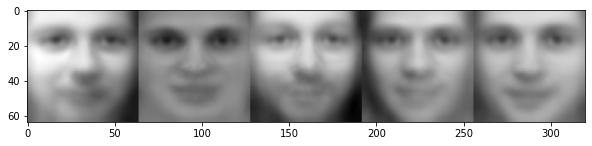

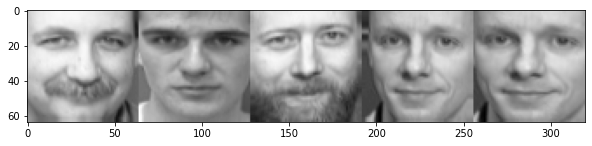

<Figure size 720x720 with 0 Axes>

<Figure size 720x720 with 0 Axes>

<Figure size 720x720 with 0 Axes>

<Figure size 720x720 with 0 Axes>

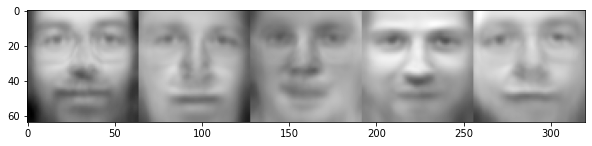

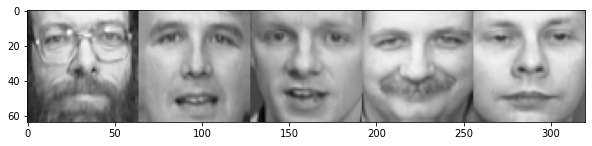

<Figure size 720x720 with 0 Axes>

<Figure size 720x720 with 0 Axes>

<Figure size 720x720 with 0 Axes>

<Figure size 720x720 with 0 Axes>

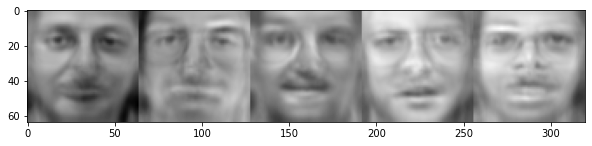

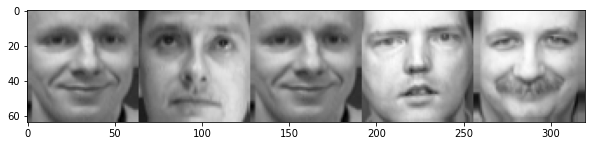

<Figure size 720x720 with 0 Axes>

<Figure size 720x720 with 0 Axes>

<Figure size 720x720 with 0 Axes>

<Figure size 720x720 with 0 Axes>

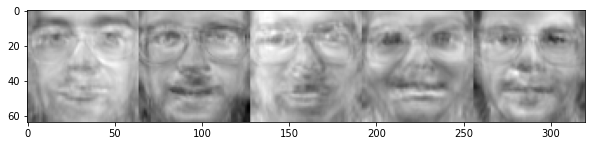

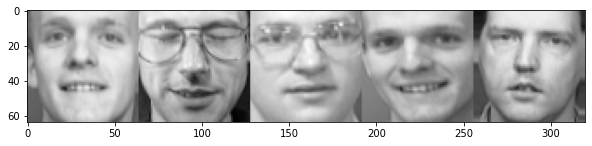

<Figure size 720x720 with 0 Axes>

<Figure size 720x720 with 0 Axes>

<Figure size 720x720 with 0 Axes>

<Figure size 720x720 with 0 Axes>

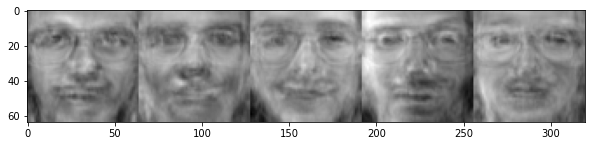

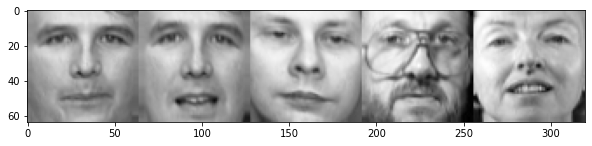

In [311]:
print_New_2(10)
print_New_2(25)
print_New_2(100)
print_New_2(1000)
print_New_2(4096)

# Using GAN

In [14]:
import tensorflow as tf
import keras 
from keras import layers
from keras.layers import LeakyReLU, Dropout, BatchNormalization, Dense, UpSampling2D, MaxPool2D, Conv2D,Reshape,Activation
import time
import os

For this try I use a generative network to try and create some new images. I also combine the train and test data.

I used https://www.kaggle.com/code/theblackmamba31/getting-started-with-gan
and https://www.youtube.com/watch?v=AALBGpLbj6Q to help guide me through making one and tried to adapt it to this dataset. If I had more time I would further tune all the variables.

I changed some, but I either got worse results or it would run too long for the time I have.

In [24]:
latent_dim = 100
BATCH_SIZE = 64

data = np.concatenate([x_train, x_test])
data = data.reshape(data.shape[0],64,64,1).astype('float32')
data = (data - data.max() / 2) / (data.max()/2)
dataset = tf.data.Dataset.from_tensor_slices(data)
dataset = dataset.shuffle(buffer_size=1024).batch(BATCH_SIZE)

This generator model runs quicker than some of my other attempts with greater filters, but I am also able to run more epochs

In [135]:
def make_generator_model():
    model = tf.keras.Sequential()
    model.add(layers.Dense(64*64*1, use_bias=False, input_shape=(latent_dim,)))
    model.add(layers.Reshape((64,64,1)))
    
    model.add(layers.Conv2D(filters = 128, kernel_size = (2,2), strides = 2 ))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())
    
    model.add(layers.Conv2D(filters = 256, kernel_size = (2,2), strides = 2 ))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())
   
    model.add(layers.Conv2DTranspose(filters = 256, kernel_size = (2,2), strides = 2))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.2))
    
    model.add(layers.Conv2DTranspose(filters = 128, kernel_size = (2,2), strides = 2))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.2))


    model.add(layers.Conv2D(1,(2,2),1, padding='same', use_bias=False, activation='tanh'))
  

    return model

In [136]:
generator = make_generator_model()
generator.summary()

Model: "sequential_27"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_27 (Dense)             (None, 4096)              409600    
_________________________________________________________________
reshape_19 (Reshape)         (None, 64, 64, 1)         0         
_________________________________________________________________
conv2d_90 (Conv2D)           (None, 32, 32, 128)       640       
_________________________________________________________________
batch_normalization_26 (Batc (None, 32, 32, 128)       512       
_________________________________________________________________
leaky_re_lu_108 (LeakyReLU)  (None, 32, 32, 128)       0         
_________________________________________________________________
conv2d_91 (Conv2D)           (None, 16, 16, 256)       131328    
_________________________________________________________________
batch_normalization_27 (Batc (None, 16, 16, 256)     

In [137]:
def make_discriminator_model():
    model = tf.keras.Sequential()
    model.add(layers.Conv2D(64, (5, 5), strides=(2, 2), padding='same',input_shape=[64, 64, 1]))
    model.add(layers.LeakyReLU())
    
    model.add(layers.Conv2D(128, (5, 5), strides=(2, 2), padding='same'))
    model.add(layers.LeakyReLU())
    
    model.add(layers.Conv2D(256, (5, 5), strides=(2, 2), padding='same'))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.3))

    model.add(layers.Flatten())
    model.add(layers.Dense(1))

    return model

In [138]:
discriminator = make_discriminator_model()
discriminator.summary()

Model: "sequential_28"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_93 (Conv2D)           (None, 32, 32, 64)        1664      
_________________________________________________________________
leaky_re_lu_112 (LeakyReLU)  (None, 32, 32, 64)        0         
_________________________________________________________________
conv2d_94 (Conv2D)           (None, 16, 16, 128)       204928    
_________________________________________________________________
leaky_re_lu_113 (LeakyReLU)  (None, 16, 16, 128)       0         
_________________________________________________________________
conv2d_95 (Conv2D)           (None, 8, 8, 256)         819456    
_________________________________________________________________
leaky_re_lu_114 (LeakyReLU)  (None, 8, 8, 256)         0         
_________________________________________________________________
dropout_40 (Dropout)         (None, 8, 8, 256)       

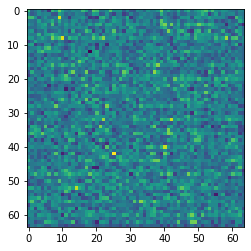

In [139]:
noise = np.random.normal(-1,1,(1,100))
img = generator(noise)
plt.imshow(img[0,:,:,0])

In [140]:
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)
generator_optimizer = tf.keras.optimizers.Adam(1e-4)
discriminator_optimizer = tf.keras.optimizers.Adam(1e-4)

In [141]:
def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output), fake_output)


def discriminator_loss(real_output, fake_output):
    real_loss = cross_entropy(tf.ones_like(real_output), real_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    total_avg_loss = 0.5 * (real_loss + fake_loss)
    return total_avg_loss

train step used the generator and discriminator to try and tell fake and real images apart.

In [142]:
def train_step(images):
    noise = tf.random.normal([BATCH_SIZE, latent_dim])

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
      generated_images = generator(noise, training=True)

      real_output = discriminator(images, training=True)
      fake_output = discriminator(generated_images, training=True)

      gen_loss = generator_loss(fake_output)
      disc_loss = discriminator_loss(real_output, fake_output)
    
     
    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))

In [143]:
test_image = tf.random.normal([25,100])
def plot_and_save_generated_images(epoch):
  plt.figure(figsize = (10,10))
  img = generator(test_image)
  for i in range(img.shape[0]):
    plt.subplot(5,5,i+1)
    
    plt.imshow(img[i,:,:,0], cmap='gray')
    
    plt.axis('off')
  plt.savefig('images_{:01d}.png'.format(epoch))  

In [144]:
def train(dataset, epochs):
  for epoch in range(epochs):
    start = time.time()
    for image_batch in dataset:
      train_step(image_batch)


    print ('Epoch:{}   Time:{} sec \n'.format(epoch + 1, np.round((time.time()-start), 2)))
   
    plot_and_save_generated_images(epoch+15)

Epoch:1   Time:21.25 sec 

Epoch:2   Time:20.93 sec 

Epoch:3   Time:20.96 sec 

Epoch:4   Time:20.82 sec 

Epoch:5   Time:20.89 sec 

Epoch:6   Time:20.85 sec 

Epoch:7   Time:20.81 sec 

Epoch:8   Time:20.88 sec 

Epoch:9   Time:20.87 sec 

Epoch:10   Time:20.89 sec 

Epoch:11   Time:20.93 sec 

Epoch:12   Time:20.93 sec 

Epoch:13   Time:20.88 sec 

Epoch:14   Time:20.78 sec 

Epoch:15   Time:20.9 sec 

Epoch:16   Time:20.95 sec 

Epoch:17   Time:20.8 sec 

Epoch:18   Time:20.79 sec 

Epoch:19   Time:20.87 sec 

Epoch:20   Time:20.87 sec 



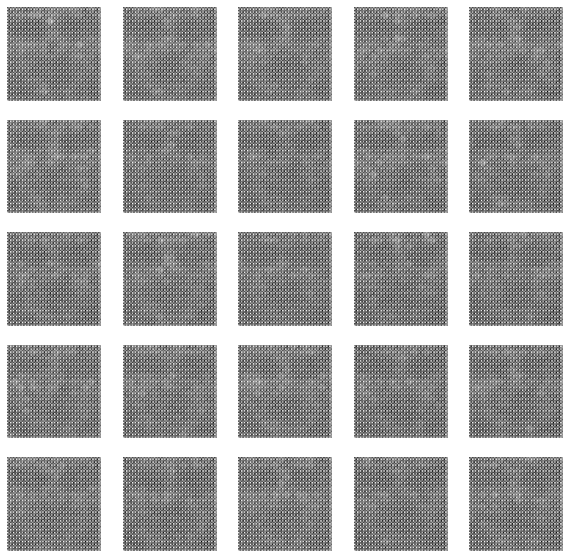

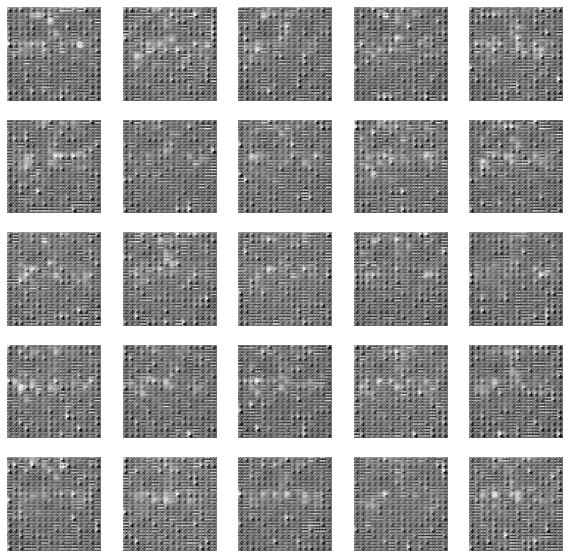

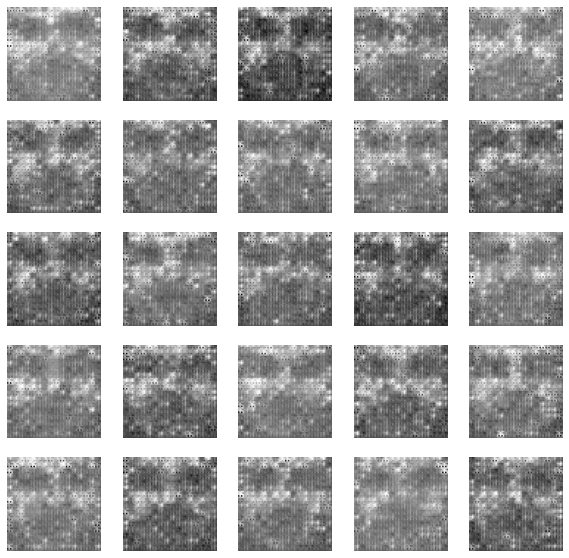

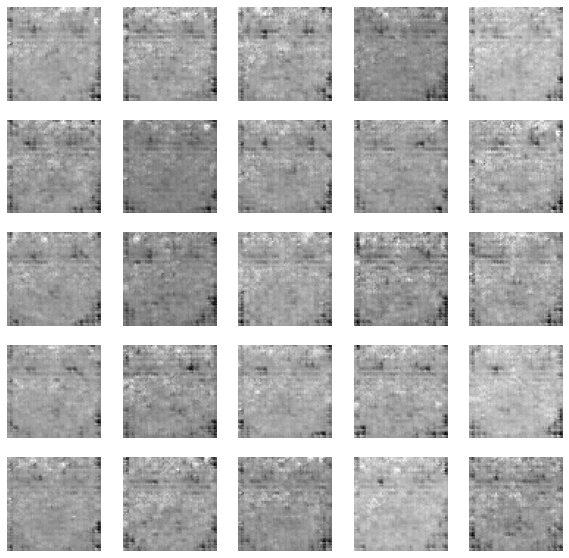

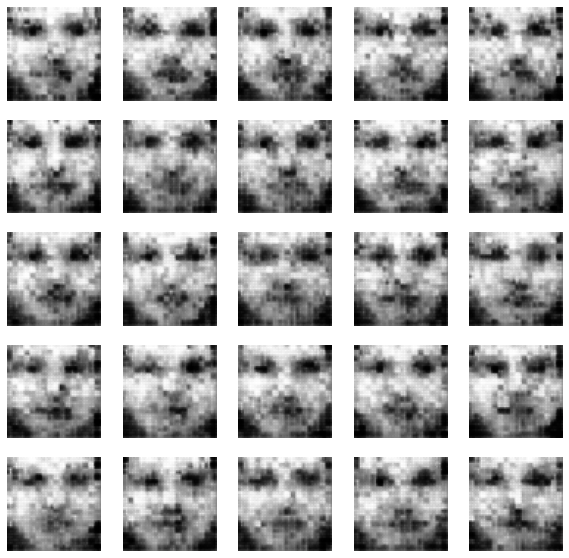

...

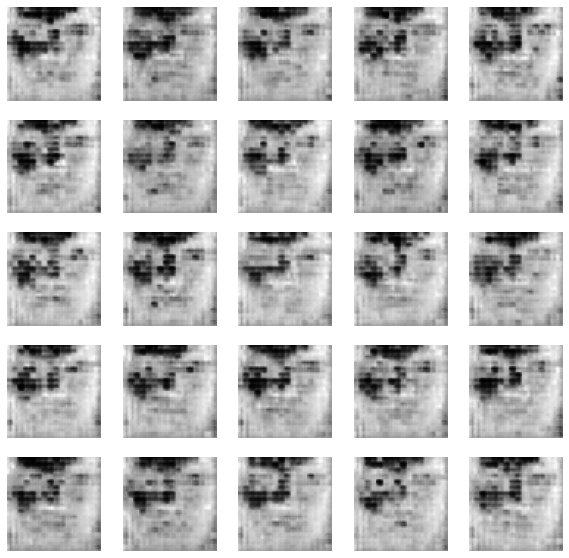

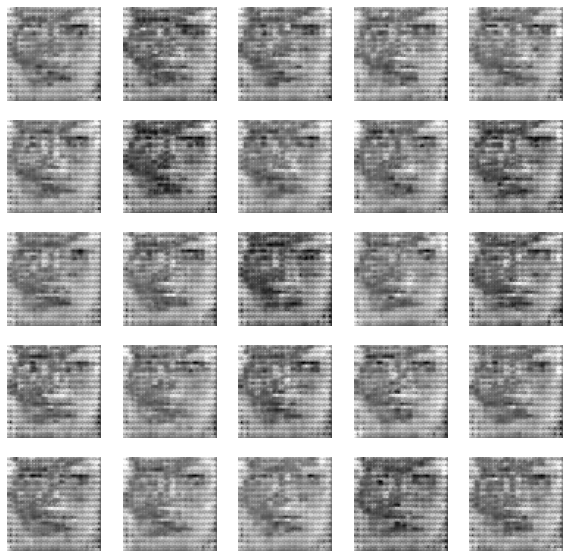

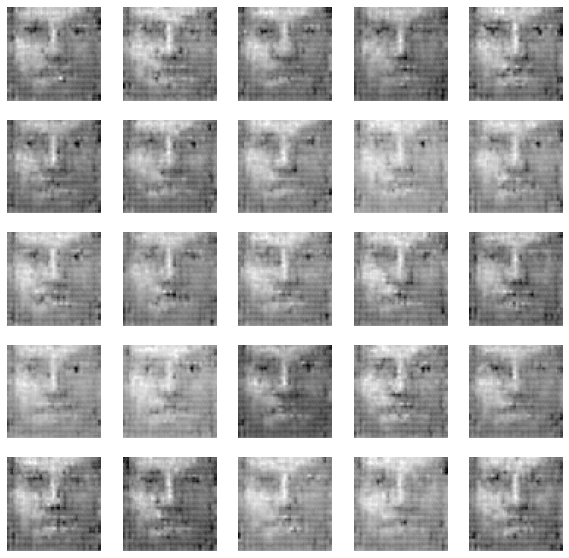

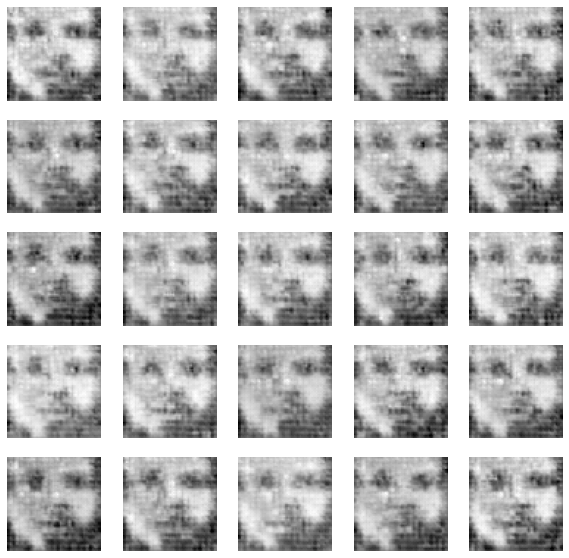

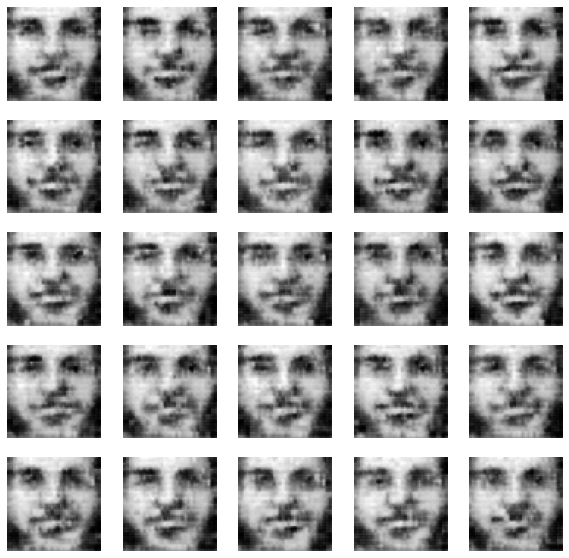

In [145]:
EPOCHS = 20
train(dataset, EPOCHS)

I am happy with the last epoch's faces that I got. I ran several times with different variables and epochs and this was the best I was able to get that looked most like a face. I think a dataset with more varied images (more people) would be better suited for this task as the faces are mostly very similar. I think a more varied dataset would give more varied generations.

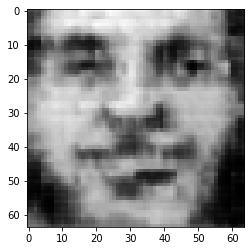

In [170]:
noise = np.random.normal(-1,1,(1,100))
img = generator(noise)
plt.imshow(img[0,:,:,0], cmap='gray')

# Updated

Updated with a better model

In [289]:
from keras.initializers import RandomNormal

noise_dim = 15  # = the dimension of the latent space
batch_size = 32
steps_per_epoch = 50
epochs = 50
N = x_train.shape[1]
optimizer = tf.keras.optimizers.Adam(0.0002, 0.5)

def create_discriminator():
    discriminator = Sequential()

    discriminator.add(tf.keras.layers.Reshape((N, N, 1), input_shape=(N, N)))

    for i in range(4):    
      discriminator.add(Conv2D(128, (3, 3), padding='same', 
                               kernel_initializer=RandomNormal(0, 0.02)))
      discriminator.add(LeakyReLU(0.2))  
    
    discriminator.add(Flatten())
    discriminator.add(Dropout(0.4))
    discriminator.add(Dense(1, activation='sigmoid')) # maps to (0,1)    
    
    return discriminator

def create_generator():
    generator = Sequential()
    
    d = 16
    generator.add(Dense(d*d*256, kernel_initializer=RandomNormal(0, 0.02), 
                        input_dim=noise_dim))
    generator.add(LeakyReLU(0.2))
    
    generator.add(Reshape((d, d, 256)))

    for i in range(2):
      generator.add(Conv2DTranspose(128, (4, 4), strides=2, 
                                    padding='same', 
                                    kernel_initializer=RandomNormal(0, 0.02)))
      generator.add(LeakyReLU(0.2))
    
    # tanh maps the output between [-1,1], which is consistent with our images
    generator.add(Conv2D(1, (3, 3), padding='same', 
                         activation='tanh', 
                         kernel_initializer=RandomNormal(0, 0.02)))    

    generator.add(Reshape((N, N))) # before it was (N,N,1) which makes things annoying in numpy
    
    return generator

In [293]:
from keras.layers import Input
from keras.models import Model
from keras.initializers import RandomNormal
from keras.layers import Dense, Conv2D, Flatten, Conv2DTranspose, Reshape
from keras.layers.advanced_activations import LeakyReLU, ReLU
from keras.models import Sequential

generator = create_generator()

print("generator")
generator.summary()

discriminator = create_discriminator()


discriminator.compile(loss='binary_crossentropy', optimizer=optimizer)
print("discriminator")
discriminator.summary()
discriminator.trainable = False 


gan_input = Input(shape=(noise_dim,))
fake_image = generator(gan_input) # pass input to generator, get fake_images

gan_output = discriminator(fake_image) # pass fake images to discriminator, get output (predictions)

gan = Model(gan_input, gan_output)

gan.compile(loss='binary_crossentropy', optimizer=optimizer)

generator
Model: "sequential_32"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_31 (Dense)             (None, 65536)             1048576   
_________________________________________________________________
leaky_re_lu_123 (LeakyReLU)  (None, 65536)             0         
_________________________________________________________________
reshape_24 (Reshape)         (None, 16, 16, 256)       0         
_________________________________________________________________
conv2d_transpose_34 (Conv2DT (None, 32, 32, 128)       524416    
_________________________________________________________________
leaky_re_lu_124 (LeakyReLU)  (None, 32, 32, 128)       0         
_________________________________________________________________
conv2d_transpose_35 (Conv2DT (None, 64, 64, 128)       262272    
_________________________________________________________________
leaky_re_lu_125 (LeakyReLU)  (None, 64, 64,

In [298]:
def im_grid(ims, flat = False, size = 8, show = True):
  n = len(ims)
  w = int(n**0.5)
  h = int(np.ceil(n/w))
  if flat:
    h = 1
    w = n
#  print(f'grid of size: {h}x{w}')
  fig, axs = plt.subplots(h, w, figsize = (size,size))
  for im, ax in zip(ims, axs.ravel()):
    ax.imshow(im, cmap='gray')    
  for ax in axs.ravel(): ax.axis('off')
  plt.tight_layout() 
  if show:
    plt.show()

  return axs

def im_row(ims):
  im_grid(ims, flat = True)

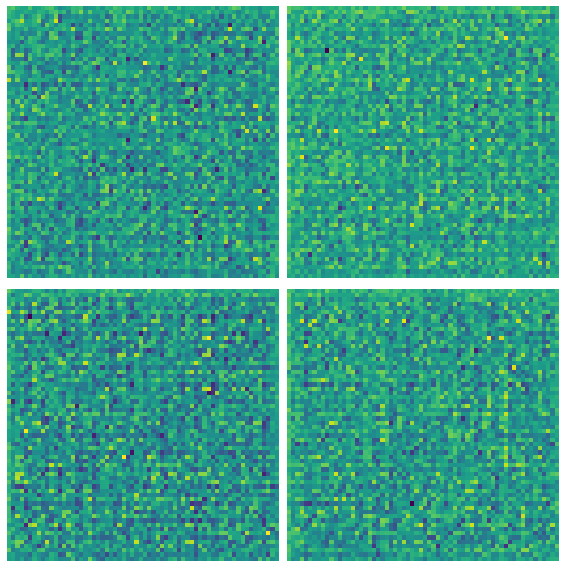

In [296]:
noise = np.random.normal(0, 1, size=(4, noise_dim))
fake_images = generator.predict(noise)

im_grid(fake_images);

Epoch: 1 	 Discriminator Loss: 0.6701357364654541 		 Generator Loss: 0.8314712047576904


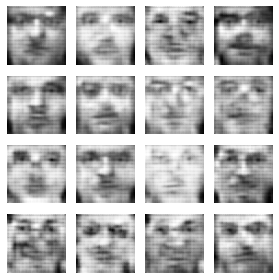

Epoch: 2 	 Discriminator Loss: 0.6993555426597595 		 Generator Loss: 0.7160829305648804


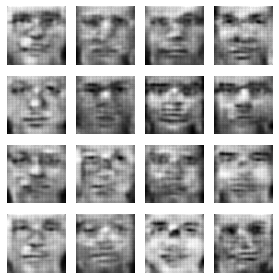

Epoch: 3 	 Discriminator Loss: 0.6984971761703491 		 Generator Loss: 0.6764786243438721


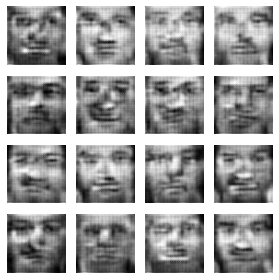

Epoch: 4 	 Discriminator Loss: 0.6744719743728638 		 Generator Loss: 0.8152084946632385


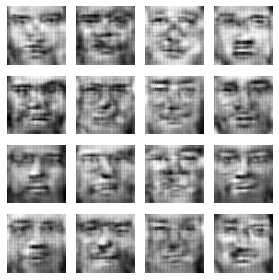

Epoch: 5 	 Discriminator Loss: 0.686254620552063 		 Generator Loss: 1.0101659297943115


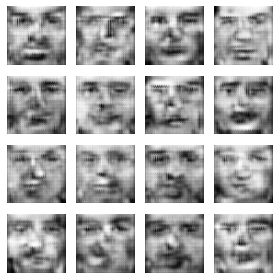

Epoch: 6 	 Discriminator Loss: 0.7304599285125732 		 Generator Loss: 0.694617509841919


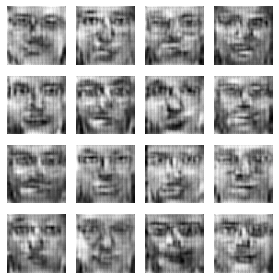

Epoch: 7 	 Discriminator Loss: 0.730780303478241 		 Generator Loss: 0.7018709182739258


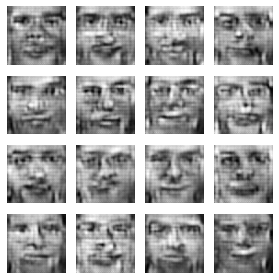

Epoch: 8 	 Discriminator Loss: 0.6125432252883911 		 Generator Loss: 1.329285979270935


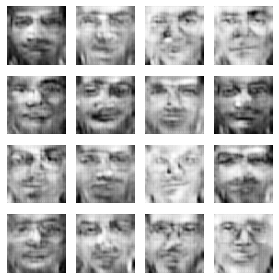

Epoch: 9 	 Discriminator Loss: 0.6079188585281372 		 Generator Loss: 0.9821910858154297


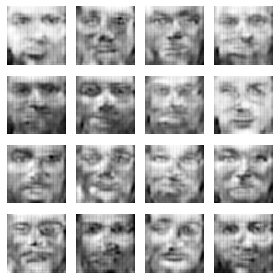

Epoch: 10 	 Discriminator Loss: 0.6411162614822388 		 Generator Loss: 1.1901333332061768


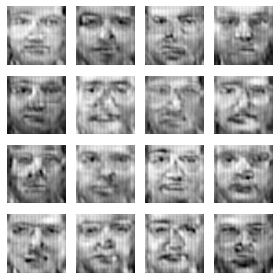

Epoch: 11 	 Discriminator Loss: 0.699413537979126 		 Generator Loss: 1.000933051109314


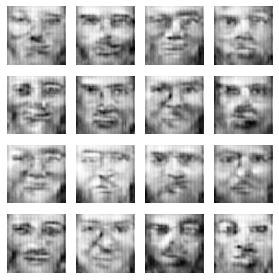

Epoch: 12 	 Discriminator Loss: 0.6077439785003662 		 Generator Loss: 1.442410945892334


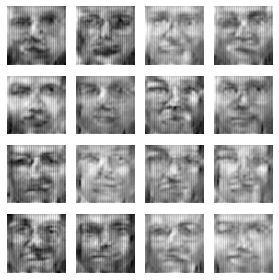

Epoch: 13 	 Discriminator Loss: 0.6677694320678711 		 Generator Loss: 1.0482529401779175


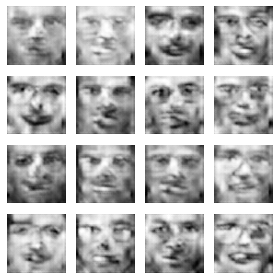

Epoch: 14 	 Discriminator Loss: 0.6481924057006836 		 Generator Loss: 1.3046733140945435


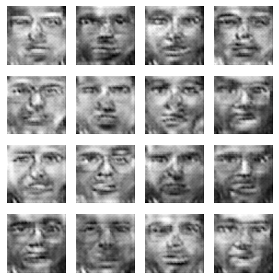

Epoch: 15 	 Discriminator Loss: 0.5660306215286255 		 Generator Loss: 1.0095252990722656


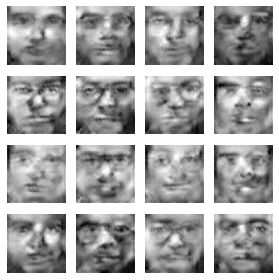

Epoch: 16 	 Discriminator Loss: 0.4740072190761566 		 Generator Loss: 1.527513027191162


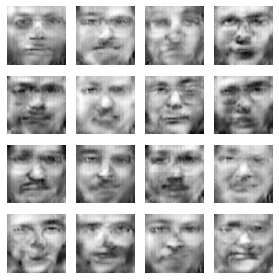

Epoch: 17 	 Discriminator Loss: 0.6687222719192505 		 Generator Loss: 0.8775491714477539


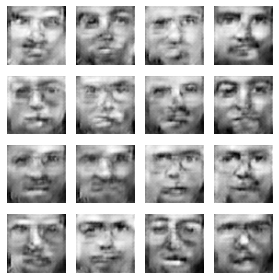

Epoch: 18 	 Discriminator Loss: 0.5166065692901611 		 Generator Loss: 1.2034718990325928


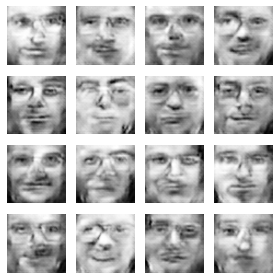

Epoch: 19 	 Discriminator Loss: 0.5904576778411865 		 Generator Loss: 1.122328758239746


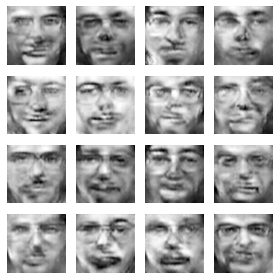

Epoch: 20 	 Discriminator Loss: 0.5900425910949707 		 Generator Loss: 1.1634246110916138


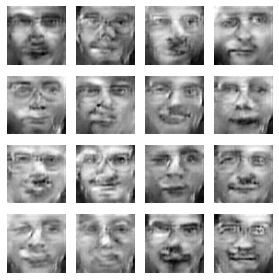

Epoch: 21 	 Discriminator Loss: 0.636326789855957 		 Generator Loss: 1.1120667457580566


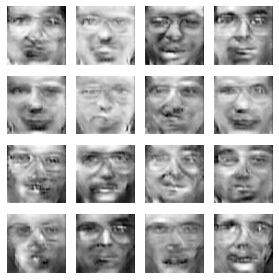

Epoch: 22 	 Discriminator Loss: 0.5630665421485901 		 Generator Loss: 1.3077476024627686


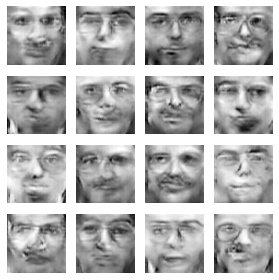

Epoch: 23 	 Discriminator Loss: 0.5698035359382629 		 Generator Loss: 1.1703532934188843


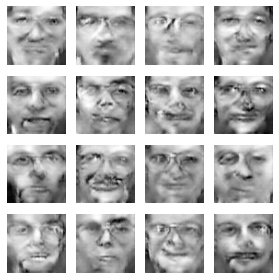

Epoch: 24 	 Discriminator Loss: 1.9067436456680298 		 Generator Loss: 3.0507688522338867


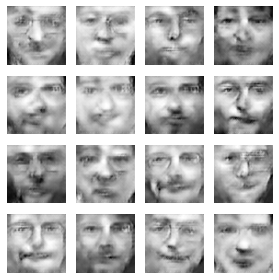

Epoch: 25 	 Discriminator Loss: 0.6317766904830933 		 Generator Loss: 1.079728126525879


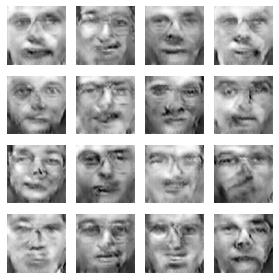

Epoch: 26 	 Discriminator Loss: 0.6293596029281616 		 Generator Loss: 1.3120222091674805


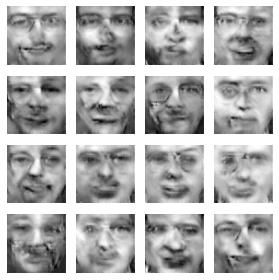

Epoch: 27 	 Discriminator Loss: 0.5679866075515747 		 Generator Loss: 1.367102861404419


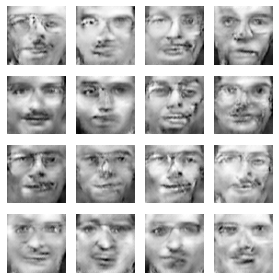

Epoch: 28 	 Discriminator Loss: 0.6153839230537415 		 Generator Loss: 1.121596336364746


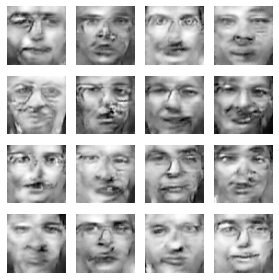

Epoch: 29 	 Discriminator Loss: 0.5659844875335693 		 Generator Loss: 1.2049651145935059


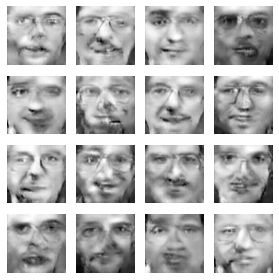

Epoch: 30 	 Discriminator Loss: 0.5731852054595947 		 Generator Loss: 1.2674330472946167


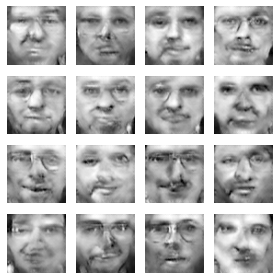

Epoch: 31 	 Discriminator Loss: 0.5549648404121399 		 Generator Loss: 1.3281153440475464


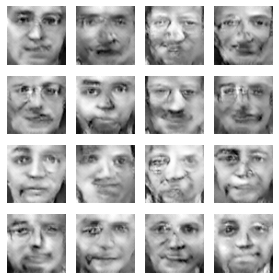

Epoch: 32 	 Discriminator Loss: 0.6134347319602966 		 Generator Loss: 1.0375617742538452


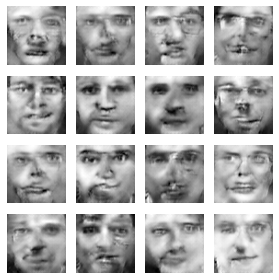

Epoch: 33 	 Discriminator Loss: 0.5751808881759644 		 Generator Loss: 1.265311360359192


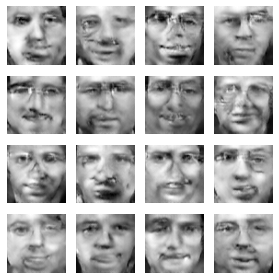

Epoch: 34 	 Discriminator Loss: 0.6103579998016357 		 Generator Loss: 1.2899469137191772


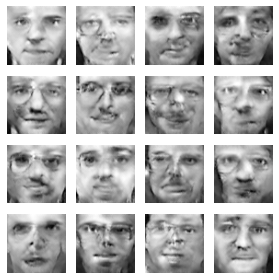

Epoch: 35 	 Discriminator Loss: 0.566457211971283 		 Generator Loss: 1.0733193159103394


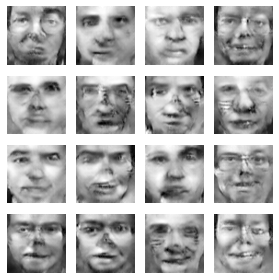

Epoch: 36 	 Discriminator Loss: 0.5650144815444946 		 Generator Loss: 1.6152238845825195


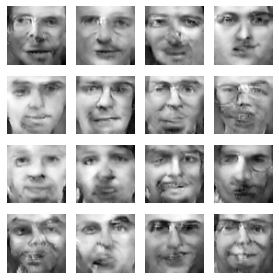

Epoch: 37 	 Discriminator Loss: 0.6249254941940308 		 Generator Loss: 1.298994541168213


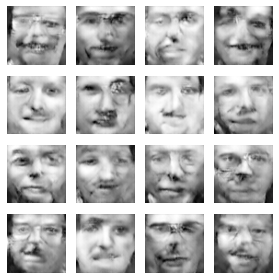

Epoch: 38 	 Discriminator Loss: 0.610329806804657 		 Generator Loss: 0.9646273851394653


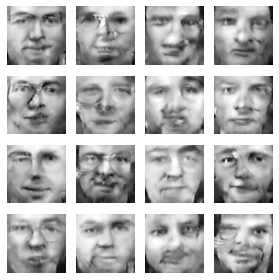

Epoch: 39 	 Discriminator Loss: 0.6138861775398254 		 Generator Loss: 0.988388180732727


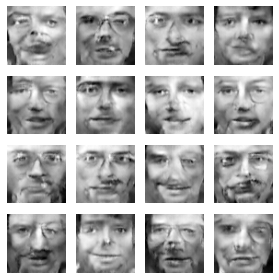

Epoch: 40 	 Discriminator Loss: 0.6333004832267761 		 Generator Loss: 1.3548414707183838


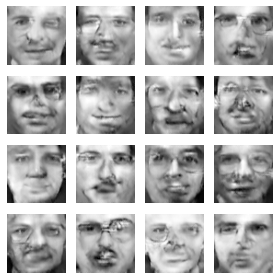

Epoch: 41 	 Discriminator Loss: 0.591987133026123 		 Generator Loss: 1.0680773258209229


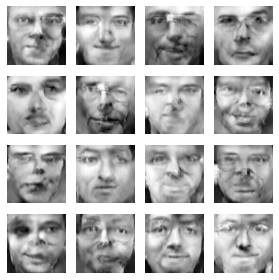

Epoch: 42 	 Discriminator Loss: 0.5428905487060547 		 Generator Loss: 1.1307133436203003


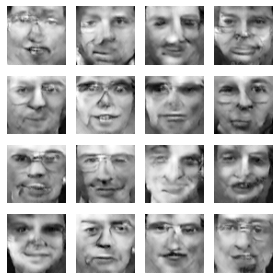

Epoch: 43 	 Discriminator Loss: 0.593936026096344 		 Generator Loss: 1.1012659072875977


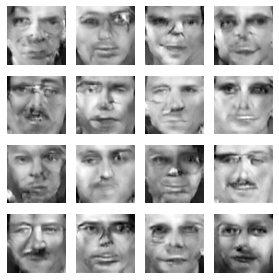

Epoch: 44 	 Discriminator Loss: 0.5656658411026001 		 Generator Loss: 1.186277151107788


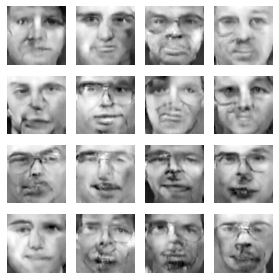

Epoch: 45 	 Discriminator Loss: 0.5861949920654297 		 Generator Loss: 1.236377239227295


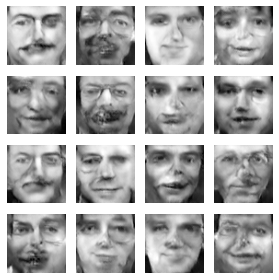

Epoch: 46 	 Discriminator Loss: 0.5451302528381348 		 Generator Loss: 1.656548023223877


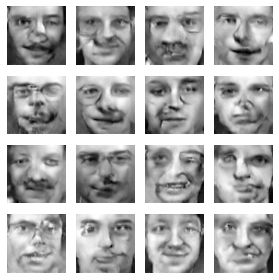

Epoch: 47 	 Discriminator Loss: 0.585314929485321 		 Generator Loss: 1.7290536165237427


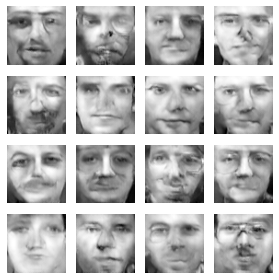

Epoch: 48 	 Discriminator Loss: 0.5424641370773315 		 Generator Loss: 1.2984154224395752


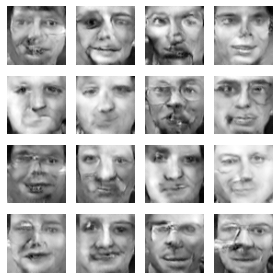

Epoch: 49 	 Discriminator Loss: 0.5499132871627808 		 Generator Loss: 1.42801034450531


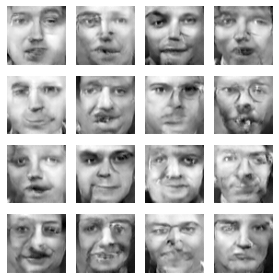

Epoch: 50 	 Discriminator Loss: 0.60662841796875 		 Generator Loss: 1.8809483051300049


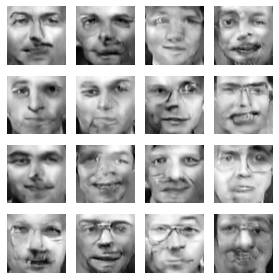

In [299]:
for epoch in range(epochs):
    for batch in range(steps_per_epoch):
        noise = np.random.normal(0, 1, size=(batch_size, noise_dim))
        fake_x = generator.predict(noise)

        real_x = x_train[np.random.randint(0, x_train.shape[0], size=batch_size)]
        
        x = np.concatenate((real_x, fake_x))

        disc_y = np.zeros(2*batch_size) # 0=super-fake, 1=super-real
        disc_y[:batch_size] = 0.9 # 1.0 would help the disc. too much

        d_loss = discriminator.train_on_batch(x, disc_y)

        y_gen = np.zeros(batch_size) # all fake...
        g_loss = gan.train_on_batch(noise, 1-y_gen) # but we swap the labels!

    print(f'Epoch: {epoch + 1} \t Discriminator Loss: {d_loss} \t\t Generator Loss: {g_loss}')
    noise = np.random.normal(0, 1, size=(16, noise_dim))
    generated_images = generator.predict(noise)
    im_grid(generated_images.squeeze(), size = 4)

These images are much better than the previous network

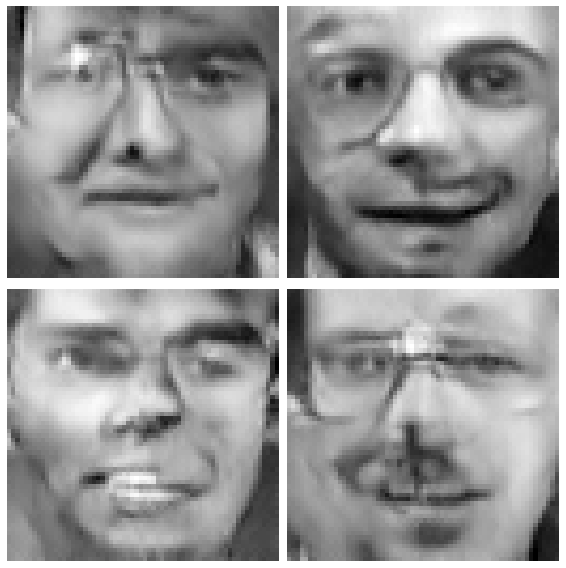

In [305]:
noise = np.random.normal(0, 1, size=(4, noise_dim))
fake_images = generator.predict(noise)

im_grid(fake_images);